<a href="https://colab.research.google.com/github/DoreenDoreen/Healthy-Home-Prediction-and-Map-Visualization/blob/main/Healthy_Home_Prediction_%26_Map_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Healthy Home Prediction & Map Visualization Project**

The goal of this project is to predict the NO2 concentration level at San Francisco by using geo-related spatial and health data.    


## Project Overview
#### 1. Set Environment & Data Upload
#### 2. Data Clearning & Preprocessing
#### 3. Exploratory Data Analysis & Data Visualization
#### 4. Model Training & Evaluation & Feature Importance Analysis

# Part 1. Set Environment & Libraries

In [2]:
# Set an environment for geopandas & other geo-related libraries

%%time

# Important library for many geopython libraries
!apt install gdal-bin python-gdal python3-gdal
# Install rtree - Geopandas requirment
!apt install python3-rtree
# Install Geopandas
!pip install git+git://github.com/geopandas/geopandas.git
# Install descartes - Geopandas requirment
!pip install descartes

# Geo-related libraries
!pip install geopandas
!pip install osmnx
!pip install contextily
!pip install folium
!pip install plotly_express
!pip install geofeather


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Package python-gdal is not available, but is referred to by another package.
This may mean that the package is missing, has been obsoleted, or
is only available from another source
However the following packages replace it:
  gdal-bin

E: Package 'python-gdal' has no installation candidate
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libspatialindex-c6 libspatialindex-dev libspatialindex6
The following NEW packages will be installed:
  libspatialindex-c6 libspatialindex-dev libspatialindex6 python3-rtree
0 upgraded, 4 newly installed, 0 to remove and 41 not upgraded.
Need to get 365 kB of archives.
After this operation, 1,799 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libspatialindex6 amd64 1.9.3-2 [247 kB]
Get:2 http://archive

In [3]:
# Others
# !pip install matplotlib==3.1.3
!pip install matplotlib

## Load Data

In [4]:
import pandas as pd
import numpy as np

In [5]:
# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
# Geo-related libraries
import geopandas as gpd
import osmnx as ox
import folium
from folium.plugins import HeatMap
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import contextily as ctx
import geofeather
from geopandas import GeoDataFrame
from shapely.geometry import Point
from shapely import wkt
from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points
from shapely import wkt

In [7]:
# Timer
from tqdm import tqdm, tqdm_notebook


In [8]:
# Regression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor

In [9]:
# Model support functions
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from scipy.stats import uniform
from sklearn.preprocessing import StandardScaler
from pprint import pprint
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
# Read air pollutant & health info
df_1 = pd.read_csv("/content/drive/My Drive/GitHub Authentication Codes/Home_n_Map.csv")
df_1.head(5)

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


In [12]:
# Check a null counts(??) and data types
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   NO value        18286 non-null  float64
 1   NO2 value       18286 non-null  float64
 2   PM2p5 value     18286 non-null  float64
 3   geometry        18286 non-null  object 
 4   road_type       18286 non-null  object 
 5   zone            18238 non-null  object 
 6   tract_name      18286 non-null  object 
 7   GEOID           18286 non-null  int64  
 8   state           18286 non-null  int64  
 9   county          18286 non-null  int64  
 10  pop_den         18286 non-null  float64
 11  wind            18270 non-null  float64
 12  temp            18270 non-null  float64
 13  Longitude       18286 non-null  float64
 14  Latitude        18286 non-null  float64
 15  Respiratory_HI  18286 non-null  object 
 16  Pt_CANCR        18286 non-null  object 
dtypes: float64(8), int64(3), object

In [13]:
# Mapping the data points
# (a) convert pandas df --> geopandas df (based on latitude & longitude) --> epsg:4326 == degree

gpd_1_degree = gpd.GeoDataFrame(df_1, geometry=gpd.points_from_xy(df_1.Longitude, df_1.Latitude), crs={'init' :'epsg:4326'})
gpd_1_degree.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   NO value        18286 non-null  float64 
 1   NO2 value       18286 non-null  float64 
 2   PM2p5 value     18286 non-null  float64 
 3   geometry        18286 non-null  geometry
 4   road_type       18286 non-null  object  
 5   zone            18238 non-null  object  
 6   tract_name      18286 non-null  object  
 7   GEOID           18286 non-null  int64   
 8   state           18286 non-null  int64   
 9   county          18286 non-null  int64   
 10  pop_den         18286 non-null  float64 
 11  wind            18270 non-null  float64 
 12  temp            18270 non-null  float64 
 13  Longitude       18286 non-null  float64 
 14  Latitude        18286 non-null  float64 
 15  Respiratory_HI  18286 non-null  object  
 16  Pt_CANCR        18286 non-null  object  
dtypes: f

/usr/local/lib/python3.12/dist-packages/pyproj/crs/crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


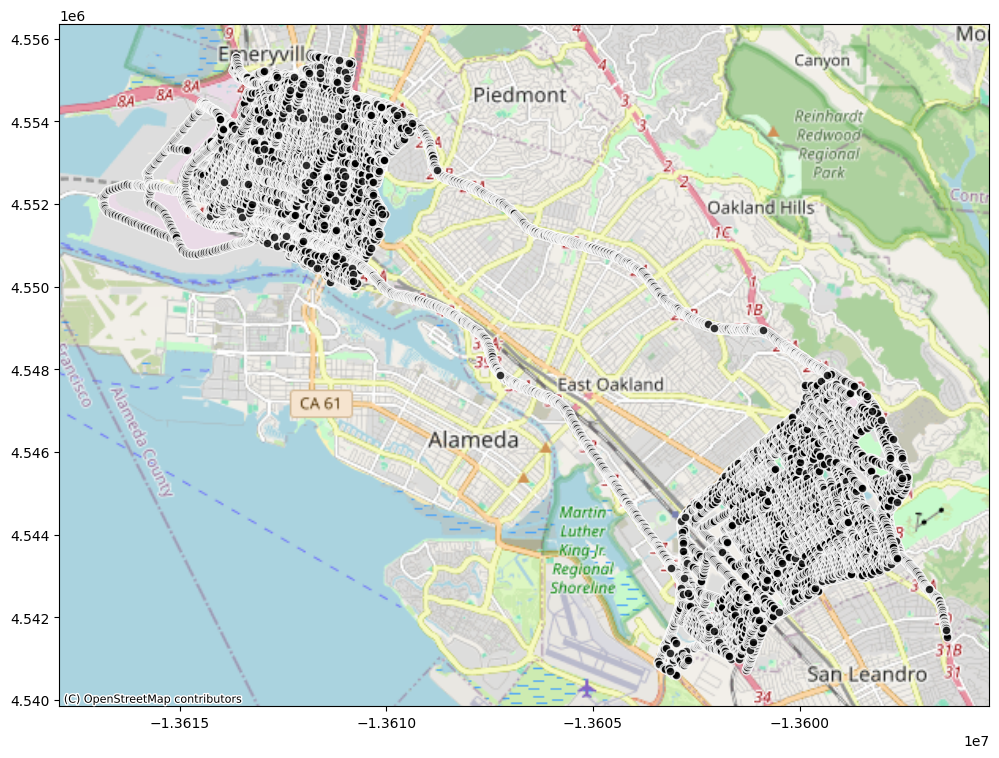

In [14]:
# Mapping the data points
# (b) draw a figure

fig, ax = plt.subplots(figsize=(12, 10))
gpd_1_degree.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="black",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
# fig.savefig('output/file_name', dpi = 400, transparent = True)

# Part 2. Data Cleaning & Preprocessing

## 1.1 Data Cleaning

In [15]:
# Check dataframe
df_1.head(2)

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


### Rename

In [16]:
# Rename (replacing 'NO value' to 'NO')
df_1 = df_1.rename(columns={'NO value': 'NO'})

# Rename (replacing 'NO2 value' to 'NO')
df_1 = df_1.rename(columns={'NO2 value': 'NO2'})

# Rename (replacing 'NO value' to 'NO')
df_1 = df_1.rename(columns={'PM2p5 value': 'PM2p5'})

# EDF_points = EDF_points.rename(index=str, columns={"NO Value": "NO", "NO2 Value": "NO2", "PM2p5 Value": "PM2p5"})

In [17]:
# count unique values for each feature - do this step before missing data， preveting unnecessary filters
print("*** Cnts of Each Feature ***")
print(df_1.nunique())

*** Cnts of Each Feature ***
NO                16015
NO2               18226
PM2p5             18281
geometry          18281
road_type             6
zone                  5
tract_name           73
GEOID                73
state                 1
county                1
pop_den              73
wind                 45
temp                 80
Longitude         18129
Latitude          18257
Respiratory_HI        3
Pt_CANCR              3
dtype: int64


### Drop Irrelevant Feature

In [18]:
# Drop columns (features)
df_1_drop = df_1.drop(['state', 'county', 'tract_name', 'GEOID'], axis=1)

df_1_drop.head(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


In [19]:
# (0) Size of data
print ("Num of rows: " + str(df_1_drop.shape[0])) # row count
print ("Num of columns: " + str(df_1_drop.shape[1])) # col count

Num of rows: 18286
Num of columns: 13


### Missing Data

In [20]:
# (1) Check missing data
print("*** Missing Values ***")
print('Sum of N/A values  ')
print(df_1_drop.isnull().sum())

*** Missing Values ***
Sum of N/A values  
NO                 0
NO2                0
PM2p5              0
geometry           0
road_type          0
zone              48
pop_den            0
wind              16
temp              16
Longitude          0
Latitude           0
Respiratory_HI     0
Pt_CANCR           0
dtype: int64


In [21]:
# (2) Choose a method of handling the missing data - drop all N/A?  avg?  forward fill?   backword fill? med?
df_1_miss = df_1_drop.dropna(axis=0, subset=['zone', 'wind', 'temp'])

df_1_miss.tail(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
18284,9.333333,9.039947,11.325624,POINT (-122.15509 37.77013811),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4
18285,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [22]:
# (3) Reset index
df_1_miss = df_1_miss.reset_index()

# (4) Check info
df_1_miss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18222 entries, 0 to 18221
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   index           18222 non-null  int64  
 1   NO              18222 non-null  float64
 2   NO2             18222 non-null  float64
 3   PM2p5           18222 non-null  float64
 4   geometry        18222 non-null  object 
 5   road_type       18222 non-null  object 
 6   zone            18222 non-null  object 
 7   pop_den         18222 non-null  float64
 8   wind            18222 non-null  float64
 9   temp            18222 non-null  float64
 10  Longitude       18222 non-null  float64
 11  Latitude        18222 non-null  float64
 12  Respiratory_HI  18222 non-null  object 
 13  Pt_CANCR        18222 non-null  object 
dtypes: float64(8), int64(1), object(5)
memory usage: 1.9+ MB


In [23]:
# (5) Remove index
df_1_miss = df_1_miss.drop(['index'], axis=1)

### Duplicated values

In [24]:
## Checking Duplicated Values

# (0) Size of data
print ("Num of rows: " + str(df_1_miss.shape[0])) # row count
print ("Num of columns: " + str(df_1_miss.shape[1])) # col count

Num of rows: 18222
Num of columns: 13


In [25]:
# (1) Extract duplicated row
df_1_miss[df_1_miss.duplicated()]

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
174,32.059862,24.190178,19.514652,POINT (-122.308528 37.81502824),secondary,industrial,220.026011,4.125000,15.000001,-122.308528,37.815028,high,0.7 - 0.8
504,16.426667,19.134740,18.727645,POINT (-122.3001287 37.80641093),secondary,mixed,3520.358174,4.083333,15.083335,-122.300129,37.806411,high,0.7 - 0.8
7161,92.638344,45.426999,28.987625,POINT (-122.233788 37.77509246),motorway,mixed,2351.277070,4.091667,15.166668,-122.233788,37.775092,high,0.7 - 0.8


In [26]:
# (2) Print the first & last rows BEFORE removing duplicated values
df_1_miss.iloc[[0,-1]]

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
18221,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [27]:
# (3) Remove duplicated values
df_1_dup = df_1_miss.drop_duplicates()
df_1_dup.tail(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
18220,9.333333,9.039947,11.325624,POINT (-122.15509 37.77013811),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4
18221,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [28]:
# (4) Reset index, creating a new df
df_1_dup.reset_index(inplace=True)

In [29]:
# (5) Check duplicated values
df_1_dup[df_1_dup.duplicated()]

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR


In [30]:
df_1_dup.shape

(18219, 14)

In [31]:
# (6) Print the first & last rows AFTER removing duplicated values
df_1_dup.iloc[[0,-1]]

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
18218,18221,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


### Outliers

In [32]:
## Checking Outliers

# Copy
df_1_out = df_1_dup.copy()

df_1_out.head(1)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.6127,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8


<Axes: ylabel='temp'>

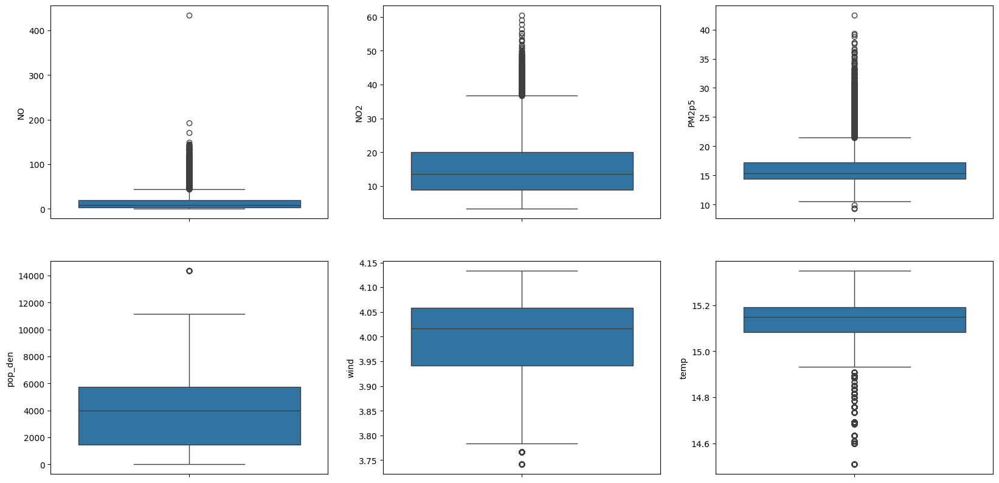

In [33]:
# Checking outliers

_,axss = plt.subplots(2,3, figsize=[20,10])  # create a 2x3 matrix = 6 figures
sns.boxplot(y ='NO', data=df_1_out, ax=axss[0, 0])
sns.boxplot(y ='NO2', data=df_1_out, ax=axss[0, 1])
sns.boxplot(y ='PM2p5', data=df_1_out, ax=axss[0, 2])
sns.boxplot(y ='pop_den', data=df_1_out, ax=axss[1][0])
sns.boxplot(y ='wind', data=df_1_out, ax=axss[1][1])
sns.boxplot(y ='temp', data=df_1_out, ax=axss[1][2])

In [34]:
# Mannually remove outliers based on knowledge
# if NO > 200 -> let all of them equl to 200
df_1_out.loc[df_1_out['NO'] > 200, 'NO'] = 200

## 1.2 Geo Feature Engineering

### Oakland city

In [35]:
# Import oakland street and map data
Oakland_poly = ox.geocode_to_gdf('Oakland, California')

Oakland_poly

,geometry,bbox_west,bbox_south,bbox_east,bbox_north,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,"POLYGON ((-122.35589 37.83569, -122.34731 37.8...",-122.355893,37.630106,-122.11442,37.885426,299681938,relation,2833530,37.804456,-122.271356,boundary,administrative,16,0.677822,city,Oakland,"Oakland, Alameda County, California, United St..."


<Axes: >

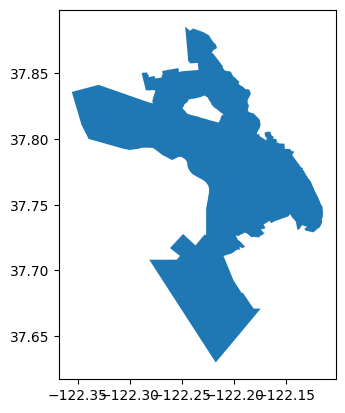

In [36]:
Oakland_poly.plot()

In [37]:
# Convert the 'geometry' column from WKT string to actual geometry objects
df_1_out['geometry'] = gpd.GeoSeries.from_wkt(df_1_out['geometry'])

# Convert the DataFrame to a GeoDataFrame
gpd_1_degree = gpd.GeoDataFrame(df_1_out, geometry='geometry', crs={'init' :'epsg:4326'})

# Display the coordinate reference systems
Oakland_poly.crs, gpd_1_degree.crs

/usr/local/lib/python3.12/dist-packages/pyproj/crs/crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


(<Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich,
 <Geographic 2D CRS: +init=epsg:4326 +type=crs>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - lon[east]: Longitude (degree)
 - lat[north]: Latitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

In [38]:
gpd_1_degree.head(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


### Spatial join

In [39]:
# spatial-join the dataset of pollutant and health with the Oakland polygon grid (make sure all data represent Oakland city)
gpd_1_city = gpd.sjoin(gpd_1_degree, Oakland_poly, how="inner", predicate="intersects")

gpd_1_city.head(2)

/tmp/ipython-input-1726995812.py:2: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  gpd_1_city = gpd.sjoin(gpd_1_degree, Oakland_poly, how="inner", predicate="intersects")


,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,...,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.677822,city,Oakland,"Oakland, Alameda County, California, United St..."
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.677822,city,Oakland,"Oakland, Alameda County, California, United St..."


In [40]:
# count unique values for each feature
print("*** Cnts of Each Feature ***")
print(gpd_1_city.nunique())

*** Cnts of Each Feature ***
index             18217
NO                15961
NO2               18161
PM2p5             18215
geometry          18215
road_type             6
zone                  5
pop_den              70
wind                 45
temp                 80
Longitude         18065
Latitude          18192
Respiratory_HI        3
Pt_CANCR              3
index_right           1
bbox_west             1
bbox_south            1
bbox_east             1
bbox_north            1
place_id              1
osm_type              1
osm_id                1
lat                   1
lon                   1
class                 1
type                  1
place_rank            1
importance            1
addresstype           1
name                  1
display_name          1
dtype: int64


In [41]:
gpd_1_city = gpd_1_city.drop(['index_right', 'bbox_east', 'bbox_north', 'bbox_south', 'bbox_west', 'place_rank', 'addresstype', 'name'], axis=1)
gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,...,Pt_CANCR,place_id,osm_type,osm_id,lat,lon,class,type,importance,display_name
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,...,0.7 - 0.8,299681938,relation,2833530,37.804456,-122.271356,boundary,administrative,0.677822,"Oakland, Alameda County, California, United St..."
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,...,0.7 - 0.8,299681938,relation,2833530,37.804456,-122.271356,boundary,administrative,0.677822,"Oakland, Alameda County, California, United St..."


### City Structure: City & Road

#### City

In [42]:
# (1) grab street data (roads and intersections) for entire city
oak_streets = ox.graph_from_place('Oakland, California', network_type = 'drive')
nodes, edges = ox.graph_to_gdfs(oak_streets)

In [43]:
nodes.head(2)

,y,x,highway,street_count,ref,junction,railway,geometry
osmid,,,,,,,,
30362160,37.824005,-122.303118,motorway_junction,3,NaN,NaN,NaN,POINT (-122.30312 37.824)
30362888,37.825844,-122.303058,motorway_junction,3,8A,NaN,NaN,POINT (-122.30306 37.82584)


In [44]:
edges.head(2)

osmid bridge        highway  \
u        v        key                                                          
30362160 30365945 0    [4757680, 781148889, 710721718]    yes  motorway_link   
         30366047 0                           32661316    yes       motorway   

                        lanes maxspeed  oneway reversed      length  \
u        v        key                                                 
30362160 30365945 0    [2, 1]   55 mph    True    False  733.297851   
         30366047 0         2   55 mph    True    False  175.699844   

                                                                geometry  ref  \
u        v        key                                                           
30362160 30365945 0    LINESTRING (-122.30312 37.824, -122.30418 37.8...  NaN   
         30366047 0    LINESTRING (-122.30312 37.824, -122.304 37.824...  NaN   

                      name tunnel access junction width  
u        v        key                                    
30362160 30365945 0    NaN    NaN    NaN      NaN   NaN  
         30366047 0    NaN    NaN    NaN      NaN   NaN

<Axes: >

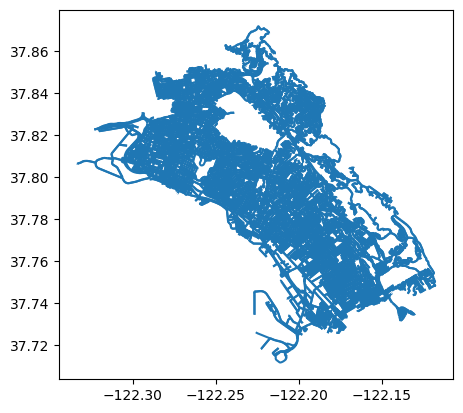

In [45]:
edges.plot()

#### Road

In [46]:
# (2 - a) Identify roads
oakland_rds = edges.copy()
print(oakland_rds['highway'].value_counts())   # count categorical column of "highway" in dataset of 'edges'; .value_counts() will Return a Series containing the frequency of each distinct row in the Dataframe.

print ("Num of rows: " + str(oakland_rds.shape[0])) # row count
print ("Num of columns: " + str(oakland_rds.shape[1])) # col count

highway
residential                        14815
secondary                           2894
tertiary                            2575
primary                              839
motorway_link                        319
unclassified                         238
motorway                             210
secondary_link                        98
trunk_link                            36
tertiary_link                         34
living_street                         24
primary_link                          16
trunk                                 14
[unclassified, residential]            4
[living_street, residential]           2
[secondary_link, motorway_link]        2
[trunk, primary]                       2
[motorway, motorway_link]              1
Name: count, dtype: int64
Num of rows: 22123
Num of columns: 15


In [47]:
# (2 - b) Clean roads

# remove '_link' in xxx_link & add it to corresponding road type
# (e.g., motorway_link is added on motorway )
oakland_rds['highway'] = oakland_rds['highway'].str.replace('_link', '')


# 'trunk'  -->  'secondary'
oakland_rds['highway'] = np.where(oakland_rds['highway'] == 'trunk', 'secondary', oakland_rds['highway'])


# 'living_street' --> 'residential'
oakland_rds['highway'] = np.where(oakland_rds['highway'] == 'living_street', 'residential', oakland_rds['highway'])

# Check results
print(oakland_rds['highway'].value_counts())

highway
residential     14839
secondary        3042
tertiary         2609
primary           855
motorway          529
unclassified      238
Name: count, dtype: int64


/tmp/ipython-input-3254668847.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='highway', data=oakland_rds, palette='viridis')


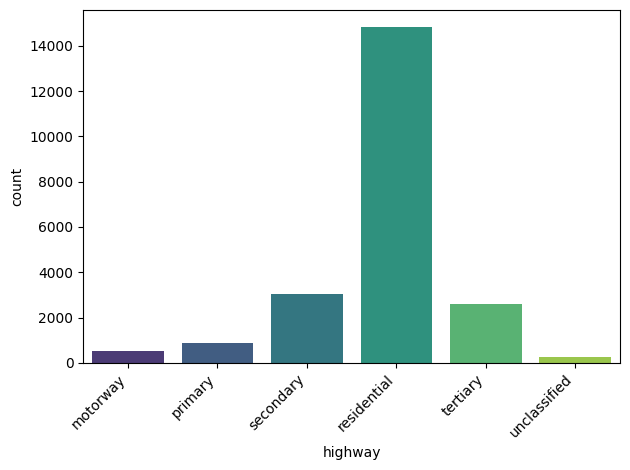

In [48]:
# Reset index before plotting
oakland_rds = oakland_rds.reset_index()

sns.countplot(x='highway', data=oakland_rds, palette='viridis')
plt.xticks(rotation=45, ha='right') # Rotate labels for better readability
plt.tight_layout() # Adjust layout to prevent labels overlapping
plt.show()

#### Map

In [49]:
# (3) Map them out

# grab subsets of roadtypes
oakland_highways = oakland_rds[oakland_rds.highway == 'motorway']
oakland_primary = oakland_rds[oakland_rds.highway == 'primary']
oakland_secondary = oakland_rds[oakland_rds.highway == 'secondary']
oakland_tertiary = oakland_rds[oakland_rds.highway == 'tertiary']
oakland_resid = oakland_rds[oakland_rds.highway == 'residential']

oakland_highways.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

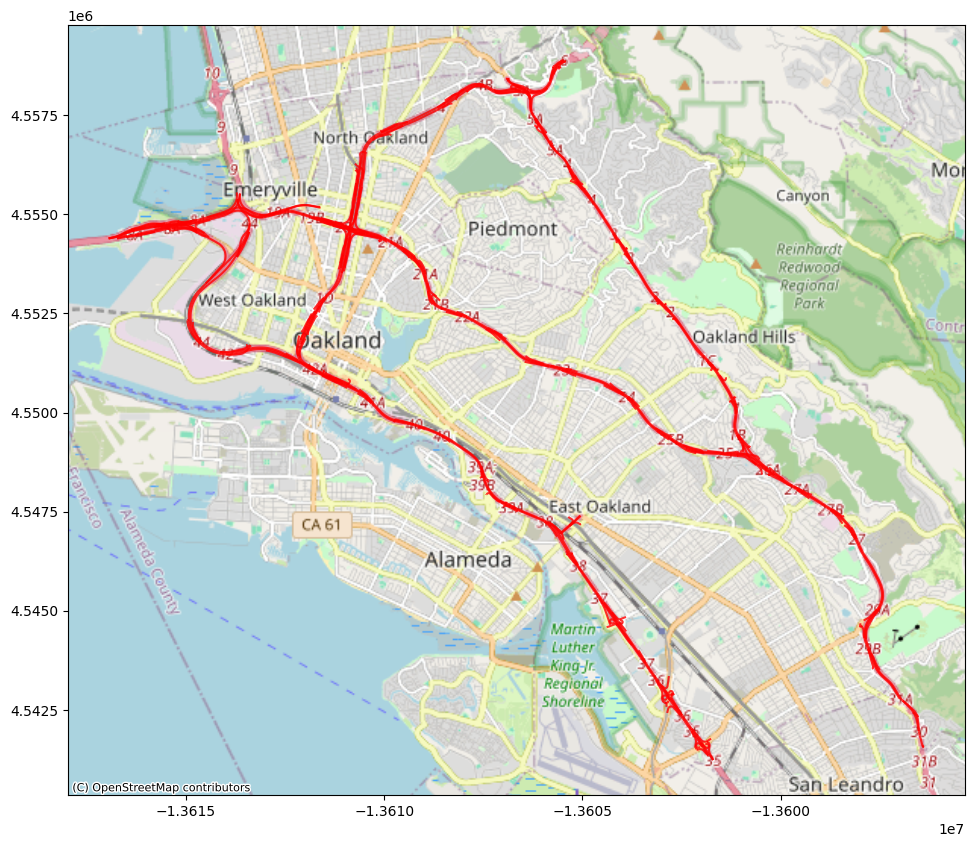

In [50]:
# Highway
fig, ax = plt.subplots(figsize=(12, 10))
oakland_highways.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="red",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

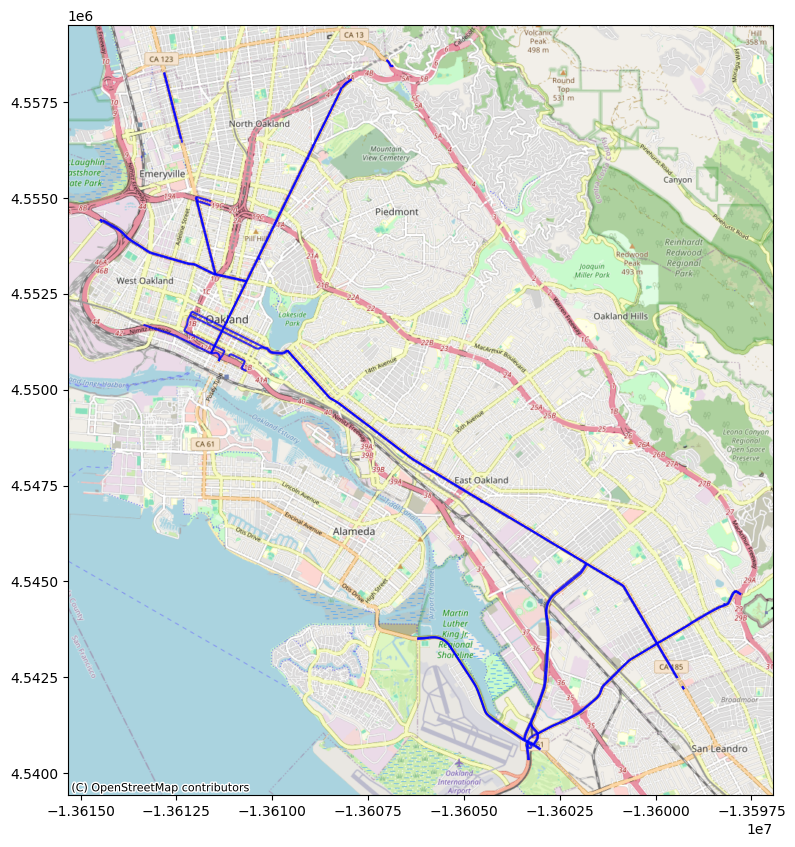

In [51]:
# Primary road
fig, ax = plt.subplots(figsize=(12, 10))
oakland_primary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="blue",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

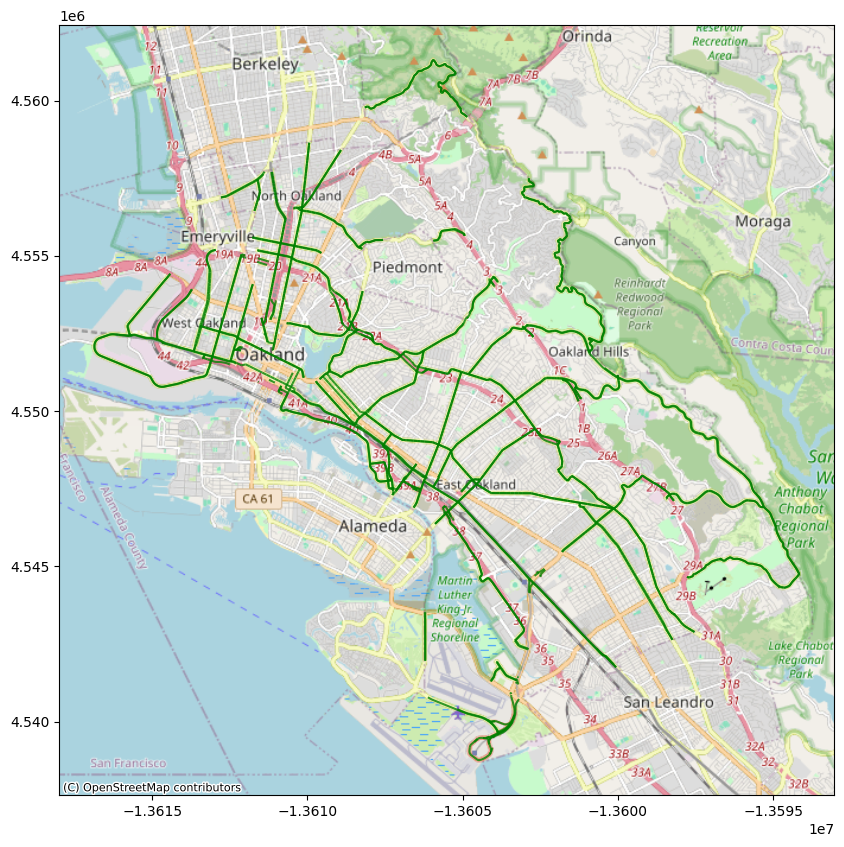

In [52]:
# Secondary road
fig, ax = plt.subplots(figsize=(12, 10))
oakland_secondary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="green",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

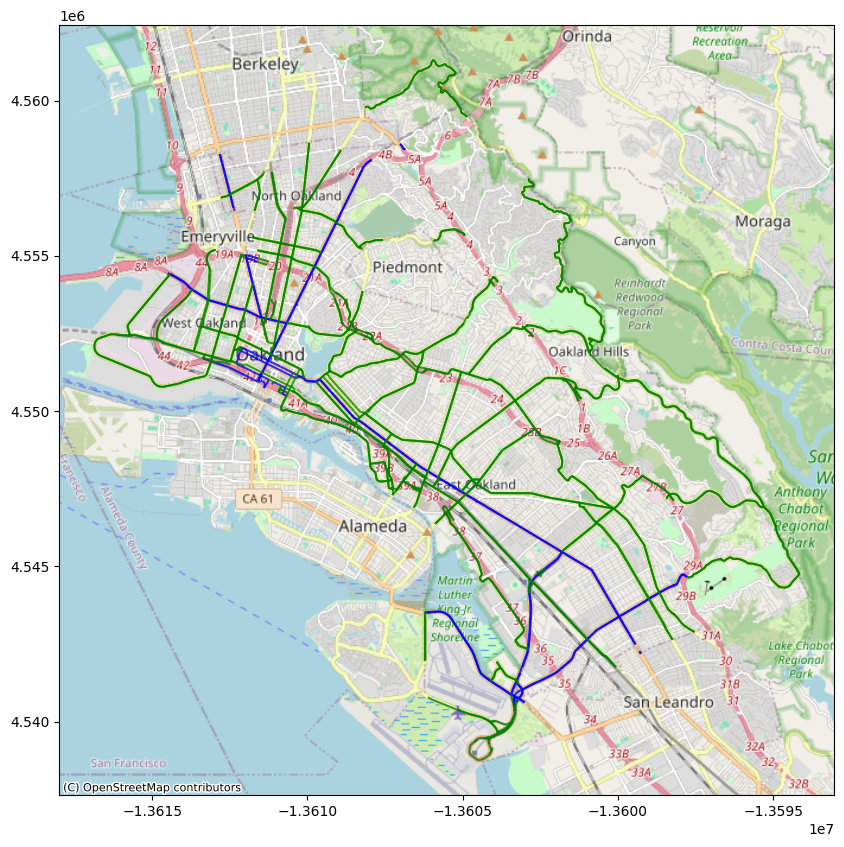

In [53]:
# Primary & Secondary

fig, ax = plt.subplots(figsize=(12, 10))
oakland_primary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="blue",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
oakland_secondary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="green",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

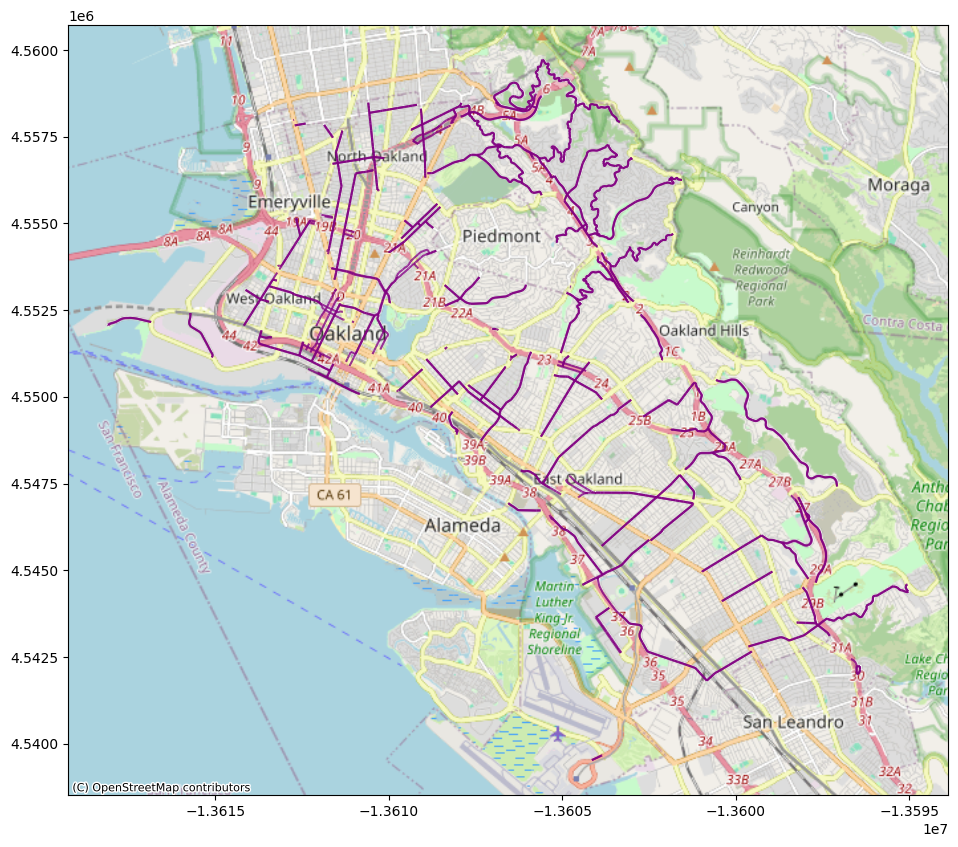

In [54]:
# Tertiary road
fig, ax = plt.subplots(figsize=(12, 10))
oakland_tertiary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="purple",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

#### Road distance

In [55]:
gpd_1_city.crs

<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [56]:
# Conver geometey from degree -> meter (utm: unit in meter)
# 'epsg:32610' == meter
# 'epsg:4326' == degree
gpd_1_city_utm = gpd_1_city.to_crs({'init': 'epsg:32610'}).copy()      # much faster to do the re-projection to meters
highway_utm = oakland_highways.to_crs({'init': 'epsg:32610'}).copy()
primary_utm = oakland_primary.to_crs({'init': 'epsg:32610'}).copy()
secondary_utm = oakland_secondary.to_crs({'init': 'epsg:32610'}).copy()
tertiary_utm = oakland_tertiary.to_crs({'init': 'epsg:32610'}).copy()

/usr/local/lib/python3.12/dist-packages/pyproj/crs/crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [57]:
# UDF
def distance_to_roadway(gps, roadway):
    '''Calculate distance from GPS point to nearest road line polygon'''
    dists = []
    for i in roadway.geometry:
        dists.append(i.distance(gps))
    return(np.min(dists))

In [58]:
# Calculate distance to nearest highway
tqdm.pandas()
gpd_1_city['closest_highway'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = highway_utm)
# gpd_1_city['closest_highway'] = gpd_1_city['geometry'].apply(distance_to_roadway, roadway = highway_utm)

100%|██████████| 18217/18217 [01:46<00:00, 171.59it/s]


In [59]:
# Calculate distance to nearest primary road
tqdm.pandas()
gpd_1_city['closest_primary'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = primary_utm)

100%|██████████| 18217/18217 [02:44<00:00, 110.72it/s]


In [60]:
# Calculate distance to nearest secondary road
tqdm.pandas()
gpd_1_city['closest_secondary'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = secondary_utm)

100%|██████████| 18217/18217 [09:28<00:00, 32.02it/s]


In [61]:
# Calculate distance to nearest tertiary road
tqdm.pandas()
gpd_1_city['closest_tertiary'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = tertiary_utm)

100%|██████████| 18217/18217 [08:11<00:00, 37.05it/s]


In [62]:
gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,...,lat,lon,class,type,importance,display_name,closest_highway,closest_primary,closest_secondary,closest_tertiary
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,...,37.804456,-122.271356,boundary,administrative,0.677822,"Oakland, Alameda County, California, United St...",1529.354679,2576.575272,3.000134e+01,0.003395
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,...,37.804456,-122.271356,boundary,administrative,0.677822,"Oakland, Alameda County, California, United St...",1510.616902,2605.774822,5.010205e-08,63.387249


### City Structure: traffic signal & stop sign

#### Identify

In [63]:
# (1) Identify traffic signals & stop signs
nodes.head(2)
nodes['highway'].value_counts()


,count
highway,
traffic_signals,820
stop,372
turning_circle,324
motorway_junction,136
crossing,13
trailhead,3
turning_loop,1


In [64]:
nodes.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

#### Map

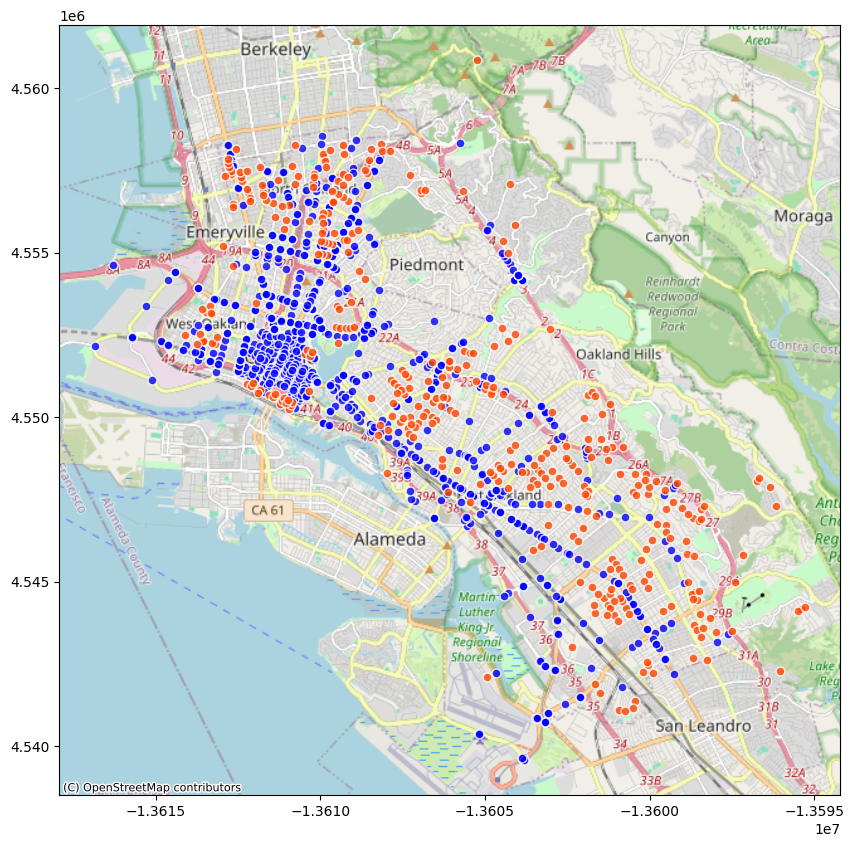

In [65]:
# (2) Map them out

trafic_signals = nodes[nodes['highway'] == 'traffic_signals']
stop_cross = nodes[nodes['highway'] == 'stop']


# Traffic signal: blue
# Stop sign: red
fig, ax = plt.subplots(figsize=(12, 10))
trafic_signals.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="blue",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
stop_cross.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="orangered",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

#### Intersectgion & Traffic Signal

In [66]:
# (3 - a) Conver geometey from degree -> meter (utm: unit in meter)
# 'epsg:32610' == meter
# 'epsg:4326' == degree
traffic_sig_utm = trafic_signals.to_crs({'init': 'epsg:32610'}).copy()    # much faster to do the re-projection to meters
stop_sign_utm = stop_cross.to_crs({'init': 'epsg:32610'}).copy()


# (3 - b) set UDF

def nearest_intersection(gps, intersections):
    ''' Calculates distance from GPS point to nearest intersection'''
    closest_point = nearest_points(gps, MultiPoint(intersections.values))[1]
    return(gps.distance(closest_point))

/usr/local/lib/python3.12/dist-packages/pyproj/crs/crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [67]:
# (3 - c) Calculate distance to nearest traffic signal
tqdm.pandas()
gpd_1_city['trafic_signal_dist'] = gpd_1_city_utm['geometry'].progress_apply(nearest_intersection, intersections = traffic_sig_utm['geometry'])
# gpd_1_city['trafic_signal_dist'] = gpd_1_city['geometry'].apply(nearest_intersection, intersections = traffic_sig_utm['geometry'])

100%|██████████| 18217/18217 [01:57<00:00, 154.86it/s]


In [68]:
# (3 - c) Calculate distance to nearest traffic signal
tqdm.pandas()
gpd_1_city['stop_sign_dist'] = gpd_1_city_utm['geometry'].progress_apply(nearest_intersection, intersections = stop_sign_utm['geometry'])

100%|██████████| 18217/18217 [00:52<00:00, 347.41it/s]


## 1.3 Category Encoding

In [69]:
gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,...,class,type,importance,display_name,closest_highway,closest_primary,closest_secondary,closest_tertiary,trafic_signal_dist,stop_sign_dist
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,...,boundary,administrative,0.677822,"Oakland, Alameda County, California, United St...",1529.354679,2576.575272,3.000134e+01,0.003395,30.001344,2213.782527
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,...,boundary,administrative,0.677822,"Oakland, Alameda County, California, United St...",1510.616902,2605.774822,5.010205e-08,63.387249,63.387249,2198.173072


In [70]:
zone = gpd_1_city['zone']
road_type = gpd_1_city['road_type']

In [71]:
# One-hot encoding: convert category features to numerical features（0 & 1） - spliting into diff columns
gpd_1_city = pd.get_dummies(gpd_1_city, columns=['road_type'], drop_first=False)      # drop_first=False: do not remove a lable to reduce multicollision
gpd_1_city = pd.get_dummies(gpd_1_city, columns=['zone'], drop_first=False)

gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,...,road_type_primary,road_type_residential,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,...,False,False,False,True,False,False,True,False,False,False
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,...,False,False,True,False,False,False,True,False,False,False


In [72]:
# Merge them back - for visualization
# axis = 1: rows invariant，but features increased
gpd_1_city = pd.concat([gpd_1_city, zone], axis = 1)
gpd_1_city = pd.concat([gpd_1_city, road_type], axis = 1)

gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,...,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential,zone,road_type
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,...,False,True,False,False,True,False,False,False,industrial,tertiary
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,...,True,False,False,False,True,False,False,False,industrial,secondary


## 1.4 Data Preparation

In [73]:
gpd_1_city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 18217 entries, 0 to 18218
Data columns (total 40 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   index                   18217 non-null  int64   
 1   NO                      18217 non-null  float64 
 2   NO2                     18217 non-null  float64 
 3   PM2p5                   18217 non-null  float64 
 4   geometry                18217 non-null  geometry
 5   pop_den                 18217 non-null  float64 
 6   wind                    18217 non-null  float64 
 7   temp                    18217 non-null  float64 
 8   Longitude               18217 non-null  float64 
 9   Latitude                18217 non-null  float64 
 10  Respiratory_HI          18217 non-null  object  
 11  Pt_CANCR                18217 non-null  object  
 12  place_id                18217 non-null  int64   
 13  osm_type                18217 non-null  object  
 14  osm_id             

In [74]:
# Drop features
gpd_1_city = gpd_1_city.drop(['index', 'Pt_CANCR'], axis=1)

### Health Conversion

In [75]:
# if df['Respiratory_HI'] contains 'high', replace "high" to "3" and save into df['Respiratory_HI']
gpd_1_city['Respiratory_HI'] = np.where(gpd_1_city['Respiratory_HI'].str.contains('high'), '3', gpd_1_city['Respiratory_HI'])

# if df['Respiratory_HI'] contains 'moderate', replace "high" to "2" and save into df['Respiratory_HI']
gpd_1_city['Respiratory_HI'] = np.where(gpd_1_city['Respiratory_HI'].str.contains('moderate'), '2', gpd_1_city['Respiratory_HI'])

# if df['Respiratory_HI'] contains 'low', replace "high" to "1" and save into df['Respiratory_HI']
gpd_1_city['Respiratory_HI'] = np.where(gpd_1_city['Respiratory_HI'].str.contains('low'), '1', gpd_1_city['Respiratory_HI'])

# convert object to float
gpd_1_city["Respiratory_HI"] = gpd_1_city.Respiratory_HI.astype(float)

gpd_1_city.head(3)
# gpd_1_city.Respiratory_HI.value_counts()

,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,...,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential,zone,road_type
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,3.0,...,False,True,False,False,True,False,False,False,industrial,tertiary
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,3.0,...,True,False,False,False,True,False,False,False,industrial,secondary
2,23.611111,23.967768,16.210698,POINT (-122.3223 37.80642),8.336845,4.133333,14.950001,-122.322301,37.806420,3.0,...,True,False,False,False,True,False,False,False,industrial,secondary


In [76]:
gpd_1_city.zone.value_counts()

,count
zone,
residential,9871
mixed,3485
commercial,3218
industrial,1419
open_space,224


In [77]:
gpd_1_city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 18217 entries, 0 to 18218
Data columns (total 38 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   NO                      18217 non-null  float64 
 1   NO2                     18217 non-null  float64 
 2   PM2p5                   18217 non-null  float64 
 3   geometry                18217 non-null  geometry
 4   pop_den                 18217 non-null  float64 
 5   wind                    18217 non-null  float64 
 6   temp                    18217 non-null  float64 
 7   Longitude               18217 non-null  float64 
 8   Latitude                18217 non-null  float64 
 9   Respiratory_HI          18217 non-null  float64 
 10  place_id                18217 non-null  int64   
 11  osm_type                18217 non-null  object  
 12  osm_id                  18217 non-null  int64   
 13  lat                     18217 non-null  float64 
 14  lon                

### Numerical & Categorical

In [78]:
# Numerical Features
numerical = ['NO', 'NO2', 'PM2p5', 'pop_den', 'wind', 'temp', 'closest_highway', 'closest_primary', 'closest_secondary', 'closest_tertiary',
             'trafic_signal_dist', 'stop_sign_dist', 'road_type_motorway', 'road_type_primary', 'road_type_residential', 'road_type_secondary', 'road_type_tertiary',
             'road_type_unclassified', 'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space', 'zone_residential', 'Longitude', 'Latitude', 'Respiratory_HI']

# Categorical Features
categorical = ['geometry', 'zone', 'road_type']

# Part 3. Exploraroty Data Analysis & Visualization

In [79]:
df_vis = gpd_1_city.copy()

## Correlation Matrix

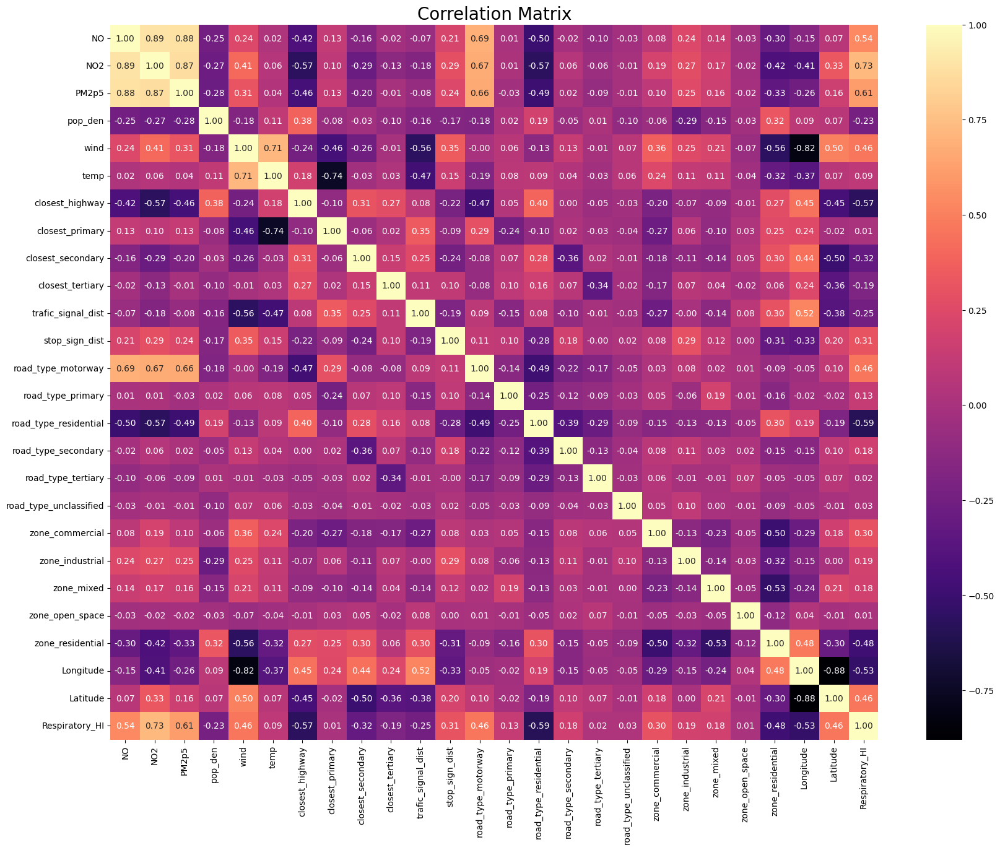

In [80]:
f, ax = plt.subplots(figsize= [20,15])
sns.heatmap(df_vis[numerical].corr(), annot=True, fmt=".2f", ax=ax, cmap = "magma" )
ax.set_title("Correlation Matrix", fontsize=20)
plt.show()

In [81]:
Corr = pd.DataFrame(df_vis[numerical].corr()['Respiratory_HI'].sort_values(ascending=False))
Corr = Corr.iloc[1:,:]
Corr.columns=['Target Correlation']
Corr

,Target Correlation
NO2,0.728081
PM2p5,0.613451
NO,0.535749
Latitude,0.462277
road_type_motorway,0.459102
wind,0.458172
stop_sign_dist,0.306845
zone_commercial,0.300532
zone_industrial,0.192210
zone_mixed,0.183287


/tmp/ipython-input-3995412207.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  g0 = sns.barplot(x="Target Correlation", y=Corr.index, data=Corr, palette='coolwarm')


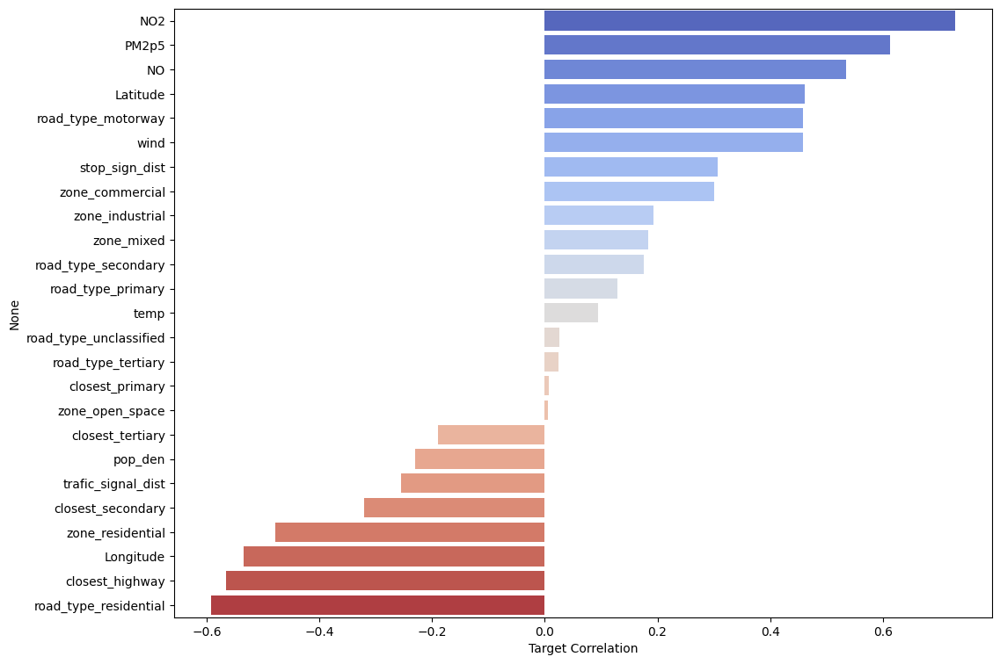

In [82]:
g0 = sns.barplot(x="Target Correlation", y=Corr.index, data=Corr, palette='coolwarm')
g0.figure.set_size_inches(12, 9)

1. NO₂ can be easily inhaled into the deep bronchioles and alveoli of the respiratory tract. Long-term exposure to low concentrations may lead to lung tissue damage and pulmonary edema. Excessive NO₂ in the atmosphere can affect the respiratory system, triggering asthma, reducing lung function, and causing lung diseases.
2. PM2.5 entering the lungs can obstruct local tissues, reduce the ventilation function of bronchi, and impair the gas exchange function of bronchioles and alveoli. PM2.5, by adsorbing harmful gases, can irritate or corrode alveolar walls, and long-term exposure may damage the respiratory defense mechanisms, leading to bronchitis, emphysema, and bronchial asthma.

## Map

In [83]:
gpd_1_vis = gpd_1_city.copy()

Text(0, 0.5, 'Latitude')

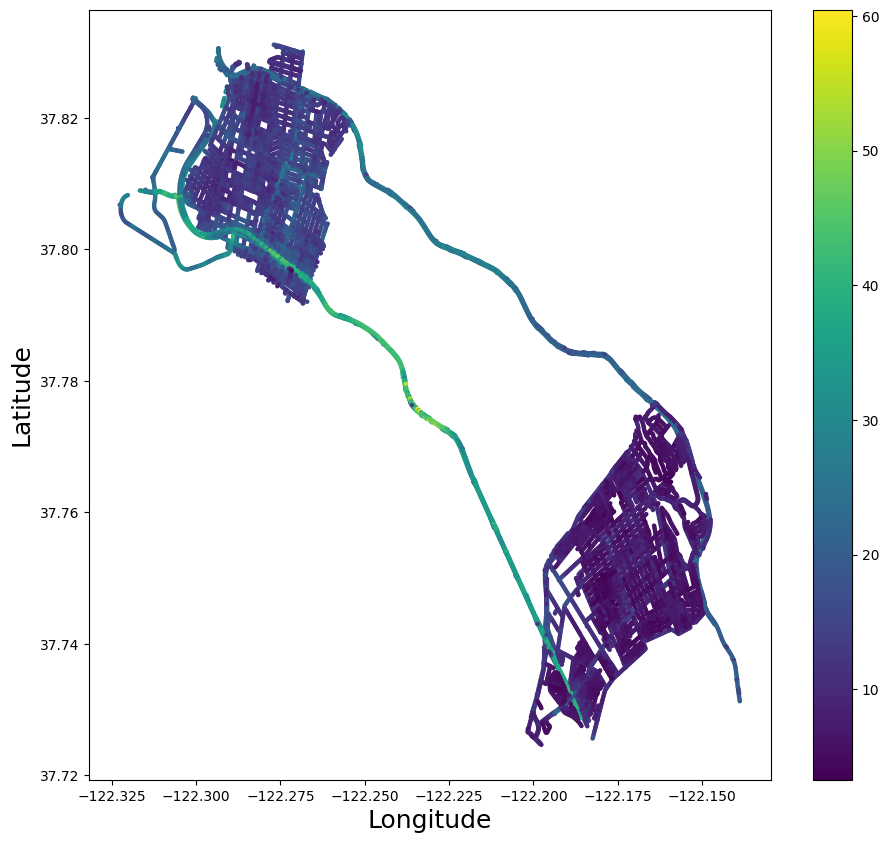

In [84]:
# Plot the overall heatmap of NO2 that will go into the web-app
plt.figure(figsize = (11, 10))
plt.scatter(gpd_1_vis.Longitude, gpd_1_vis.Latitude, s=5, c = gpd_1_vis.NO2)
plt.colorbar(); plt.xlabel('Longitude', fontsize=18); plt.ylabel('Latitude', fontsize=18)

Text(0, 0.5, 'Latitude')

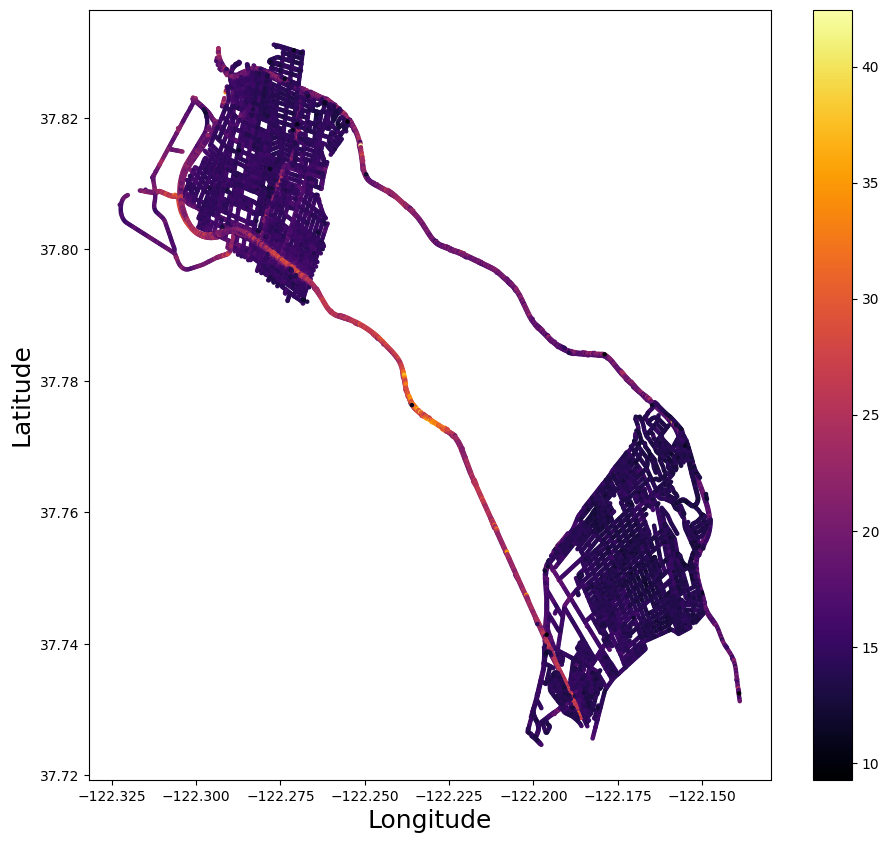

In [85]:
# Plot the overall heatmap of PM2.5 that will go into the web-app
plt.figure(figsize = (11, 10))
plt.scatter(gpd_1_vis.Longitude, gpd_1_vis.Latitude, s=5, c = gpd_1_vis.PM2p5, cmap='inferno')
plt.colorbar(); plt.xlabel('Longitude', fontsize=18); plt.ylabel('Latitude', fontsize=18)

## Boxplot - Roads

/tmp/ipython-input-3590636017.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = 'road_type', data = df_vis, palette='viridis');


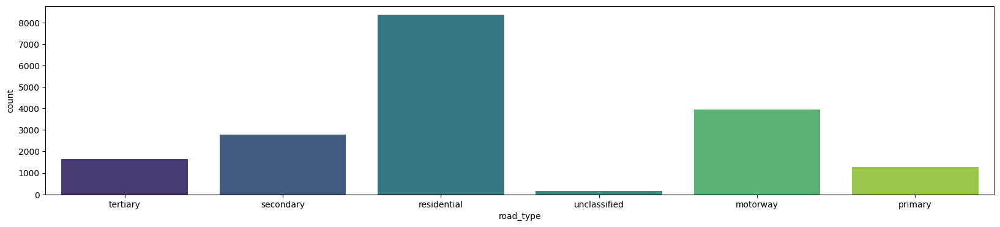

In [86]:
# Check the sizes of data count
plt.figure(figsize=(20,4))
sns.countplot(x = 'road_type', data = df_vis, palette='viridis');

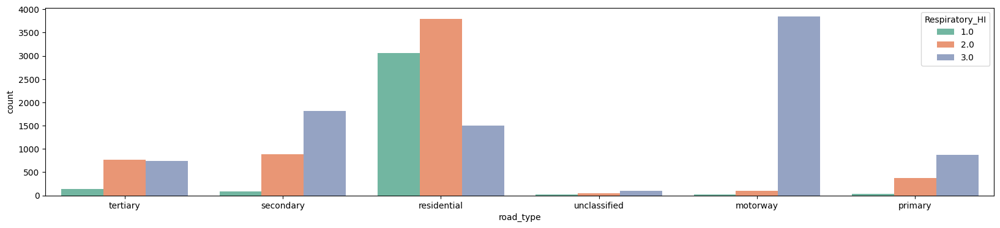

In [87]:
# Road type & health
plt.figure(figsize=(20,4))
sns.countplot(x = 'road_type', hue = df_vis['Respiratory_HI'], data = df_vis, palette='Set2');

/tmp/ipython-input-2791227960.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df_vis['road_type'], y = df_vis['NO2'], palette="Set2");


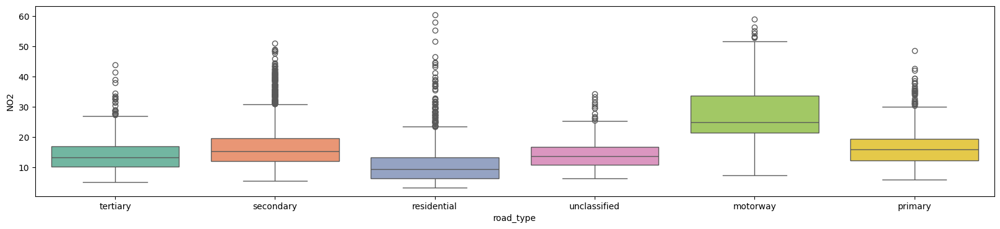

In [88]:
# NO2: road type
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['road_type'], y = df_vis['NO2'], palette="Set2");

/tmp/ipython-input-2463596526.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df_vis['road_type'], y = df_vis['PM2p5'], palette="Set2");


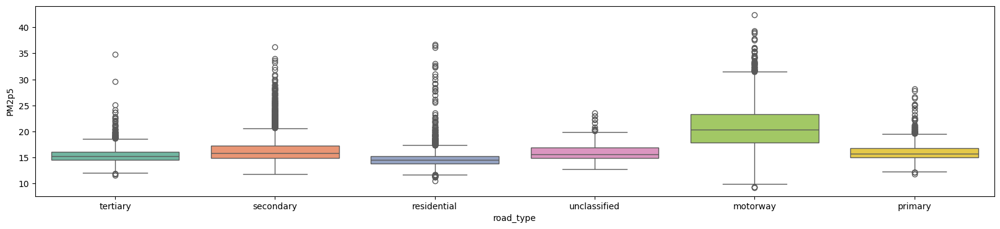

In [89]:
# PM2.5: road type
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['road_type'], y = df_vis['PM2p5'], palette="Set2");

## Boxplot - Zones

/tmp/ipython-input-505991278.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = 'zone', data=df_vis, palette='Set2');


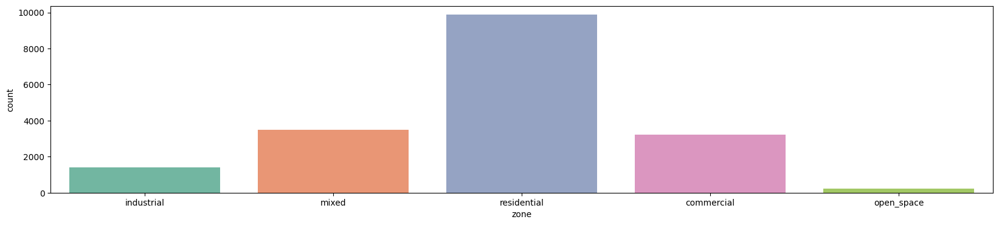

In [90]:
# Check the size of data count
plt.figure(figsize=(20,4))
sns.countplot(x = 'zone', data=df_vis, palette='Set2');

/tmp/ipython-input-1254493450.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df_vis['zone'], y=df_vis['NO2'], palette="Set2");


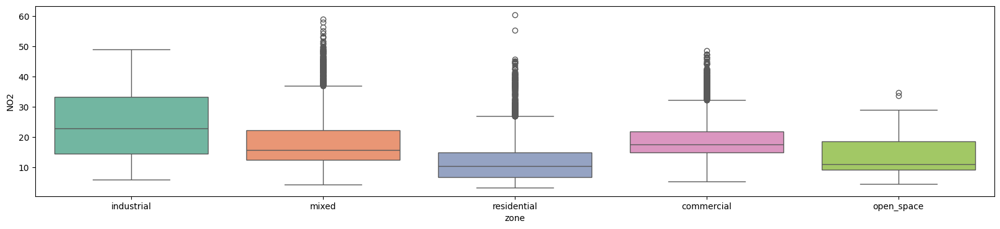

In [91]:
# NO2: zone
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['zone'], y=df_vis['NO2'], palette="Set2");

/tmp/ipython-input-1160531305.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df_vis['zone'], y=df_vis['PM2p5'], palette="Set2");


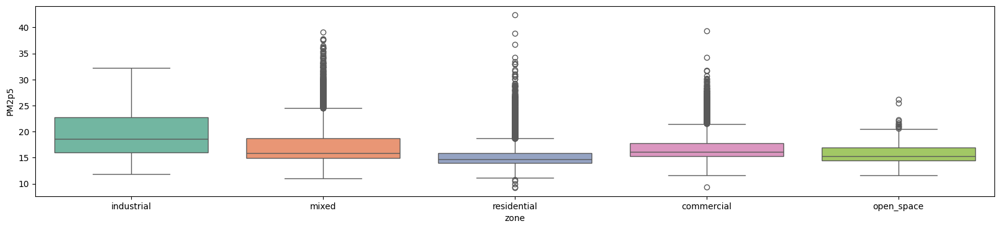

In [92]:
# PM2.5: zone
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['zone'], y=df_vis['PM2p5'], palette="Set2");

<Axes: xlabel='zone', ylabel='NO2'>

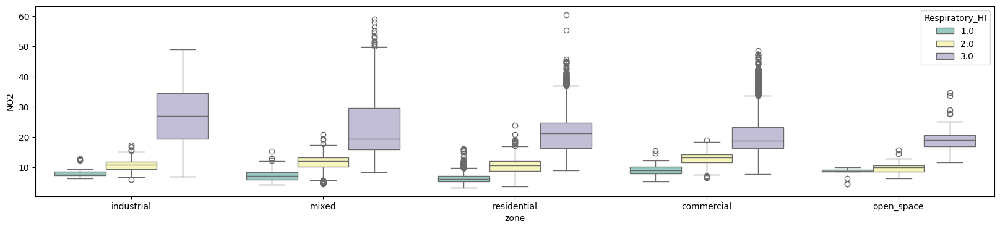

In [93]:
# NO2: zone & health
plt.figure(figsize=(20,4))
sns.boxplot(x=df_vis['zone'], y=df_vis['NO2'], hue=df_vis['Respiratory_HI'], palette='Set3')

<Axes: xlabel='zone', ylabel='PM2p5'>

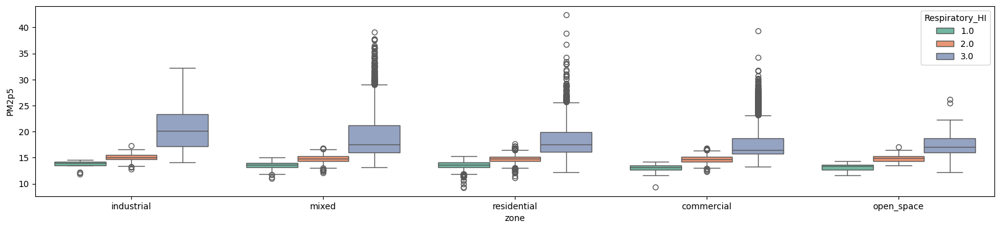

In [94]:
# PM2.5: zone & health
plt.figure(figsize=(20,4))
sns.boxplot(x=df_vis['zone'], y=df_vis['PM2p5'], hue=df_vis['Respiratory_HI'], palette='Set2')

## Distance

Text(0, 0.5, 'PM2.5 (ug/m3)')

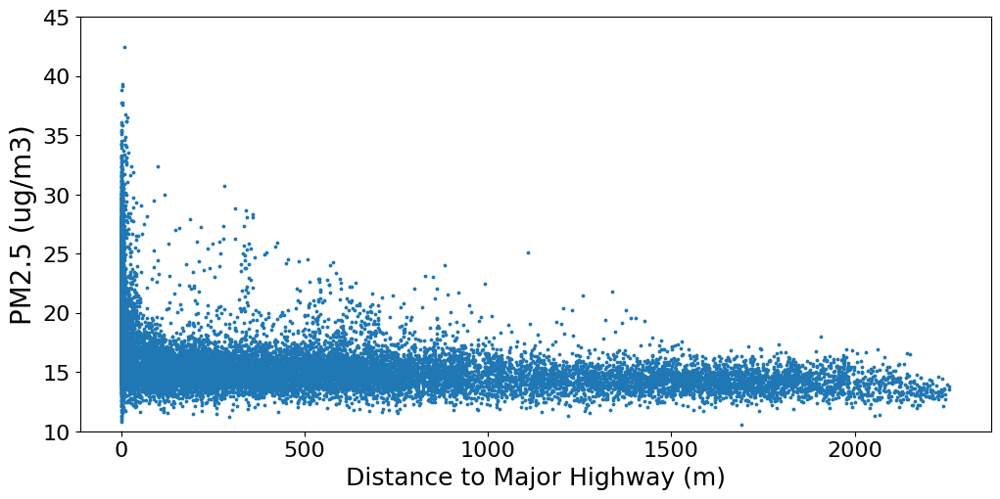

In [95]:
# Distribution of PM2p5
plt.figure(figsize=(12, 5.5))
plt.scatter(df_vis['closest_highway'], df_vis['PM2p5'], s=3)
plt.ylim(10, 45)
plt.tick_params(labelsize=16)
plt.xlabel('Distance to Major Highway (m)', fontsize=18); plt.ylabel('PM2.5 (ug/m3)', fontsize=20)
# plt.savefig('highway_distance.png', format='png', dpi=300)

Text(0, 0.5, 'NO2')

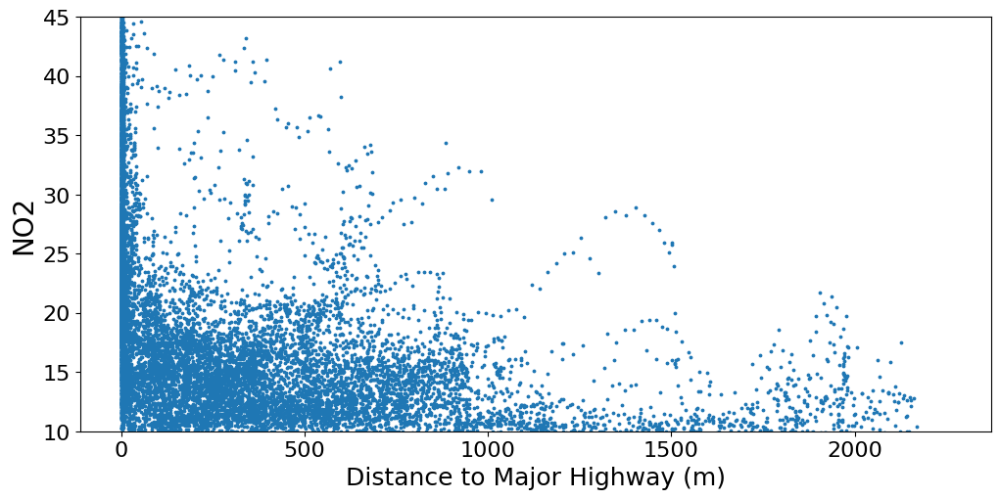

In [96]:
# Distribution of NO2
plt.figure(figsize=(12, 5.5))
plt.scatter(df_vis['closest_highway'], df_vis['NO2'], s=3)
plt.ylim(10, 45)
plt.tick_params(labelsize=16)
plt.xlabel('Distance to Major Highway (m)', fontsize=18); plt.ylabel('NO2', fontsize=20)
# plt.savefig('highway_distance.png', format='png', dpi=300)

# Part 4. Model Training & Evaluation

In [97]:
df_model = df_vis.copy()

In [98]:
def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '-', color='black')


def pred_summary(pred, ytest, limit = 200):
    """Plotting for test set predictions"""
    sns.scatterplot(x=pred, y=ytest)
    abline(1, 0) #1-1 line
    plt.ylim(0, limit); plt.xlim(0, limit)
    plt.tick_params(labelsize=18)

    print('RMSE', np.sqrt(mean_squared_error(ytest, pred)))
    print('R2', r2_score(ytest, pred))


## Feature Selection

In [99]:
df_model[numerical].columns

Index(['NO', 'NO2', 'PM2p5', 'pop_den', 'wind', 'temp', 'closest_highway',
       'closest_primary', 'closest_secondary', 'closest_tertiary',
       'trafic_signal_dist', 'stop_sign_dist', 'road_type_motorway',
       'road_type_primary', 'road_type_residential', 'road_type_secondary',
       'road_type_tertiary', 'road_type_unclassified', 'zone_commercial',
       'zone_industrial', 'zone_mixed', 'zone_open_space', 'zone_residential',
       'Longitude', 'Latitude', 'Respiratory_HI'],
      dtype='object')

In [100]:
X = df_model[numerical].drop(['Respiratory_HI', 'Longitude','Latitude', 'road_type_unclassified','NO', 'NO2', 'PM2p5'], axis=1)

X.columns

Index(['pop_den', 'wind', 'temp', 'closest_highway', 'closest_primary',
       'closest_secondary', 'closest_tertiary', 'trafic_signal_dist',
       'stop_sign_dist', 'road_type_motorway', 'road_type_primary',
       'road_type_residential', 'road_type_secondary', 'road_type_tertiary',
       'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space',
       'zone_residential'],
      dtype='object')

## Train-Test Split & Feature Scaling

In [101]:
# NO2
y_NO2 = df_model['NO2']


# NO2 Split the Data
X_train_NO2, X_test_NO2, y_train_NO2, y_test_NO2 = model_selection.train_test_split(X, y_NO2, test_size=0.25, random_state= 1)
print('training data has ' + str(X_train_NO2.shape[0]) + ' observation with ' + str(X_train_NO2.shape[1]) + ' features')
print('test data has ' + str(X_test_NO2.shape[0]) + ' observation with ' + str(X_test_NO2.shape[1]) + ' features')

training data has 13662 observation with 19 features
test data has 4555 observation with 19 features


In [102]:
# # Feature Scaling
# scaler = StandardScaler()
# scaler.fit(X_train_NO2)
# X_train_NO2 = scaler.transform(X_train_NO2)
# X_test_NO2 = scaler.transform(X_test_NO2)

In [103]:
y_PM = df_model['PM2p5']


# PM2p5 Split the Data
X_train_PM, X_test_PM, y_train_PM, y_test_PM = model_selection.train_test_split(X, y_PM, test_size=0.25, random_state= 1)
print('training data has ' + str(X_train_PM.shape[0]) + ' observation with ' + str(X_train_PM.shape[1]) + ' features')
print('test data has ' + str(X_test_PM.shape[0]) + ' observation with ' + str(X_test_PM.shape[1]) + ' features')

training data has 13662 observation with 19 features
test data has 4555 observation with 19 features


In [104]:
# # Feature Scaling
# scaler = StandardScaler()
# scaler.fit(X_train_PM)
# X_train_PM = scaler.transform(X_train_PM)
# X_test_PM = scaler.transform(X_test_PM)

## NO2

### Ensemble learning - Bagging

In [105]:
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(n_jobs=2, random_state=43)

params = {'max_features': [6, 8, 10],
          'n_estimators': [150, 200]}

RFores_GridSearch_no2 = GridSearchCV(forest, params, cv=5, scoring = 'neg_mean_squared_error')
RFores_GridSearch_no2.fit(X_train_NO2, y_train_NO2)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2, random_state=43),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [106]:
#  Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(RFores_GridSearch_no2.best_score_)))
print('Best parameters', RFores_GridSearch_no2.best_params_)

Best score (RMSE) 2.2893742440864715
Best parameters {'max_features': 10, 'n_estimators': 200}


RMSE 2.173186113959284
R2 0.9404996891814149


Text(0, 0.5, 'Observed NO$_2$')

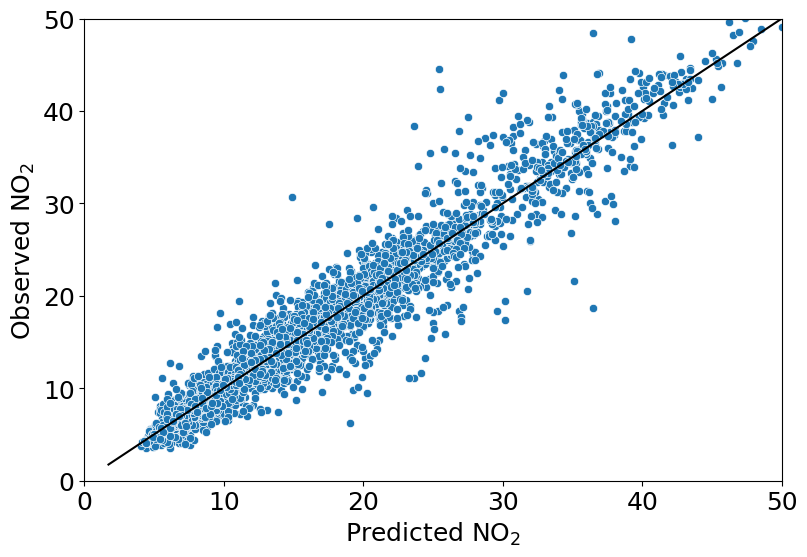

In [107]:
fig = plt.figure(figsize=(9,6))
RFores_out_no2 = RFores_GridSearch_no2.predict(X_test_NO2)
pred_summary(RFores_out_no2, y_test_NO2, limit=50)   # call previously created function to draw scatterplot to show relationshiop between predicted NO2 and real test score on NO2
plt.xlabel('Predicted NO$_2$', fontsize = 18)
plt.ylabel('Observed NO$_2$', fontsize=18)

In [108]:
FI_rf = pd.DataFrame(RFores_GridSearch_no2.best_estimator_.feature_importances_, index=X_train_NO2.columns, columns=['Feature Importance (RF)'])
FI_rf = FI_rf.sort_values(by='Feature Importance (RF)', ascending=False)
FI_rf   # major factor identification

,Feature Importance (RF)
closest_highway,0.355895
road_type_motorway,0.135704
wind,0.128974
temp,0.061663
road_type_residential,0.054664
closest_primary,0.049462
pop_den,0.042780
zone_residential,0.036653
stop_sign_dist,0.031385
closest_secondary,0.029970


### Use SHAP to deeply explore feature importance direction

In [109]:
# Import Libraries
import shap

In [110]:
# SHAP analysis
# Initialize the SHAP explainer
explainer = shap.TreeExplainer(RFores_GridSearch_no2.best_estimator_)

In [111]:
# Select 1500 sample cases from test data to prevent the execution time from exceeding expectations.
test_sample = X_test_NO2.sample(n=1500, random_state=42)
shap_values = explainer.shap_values(test_sample)

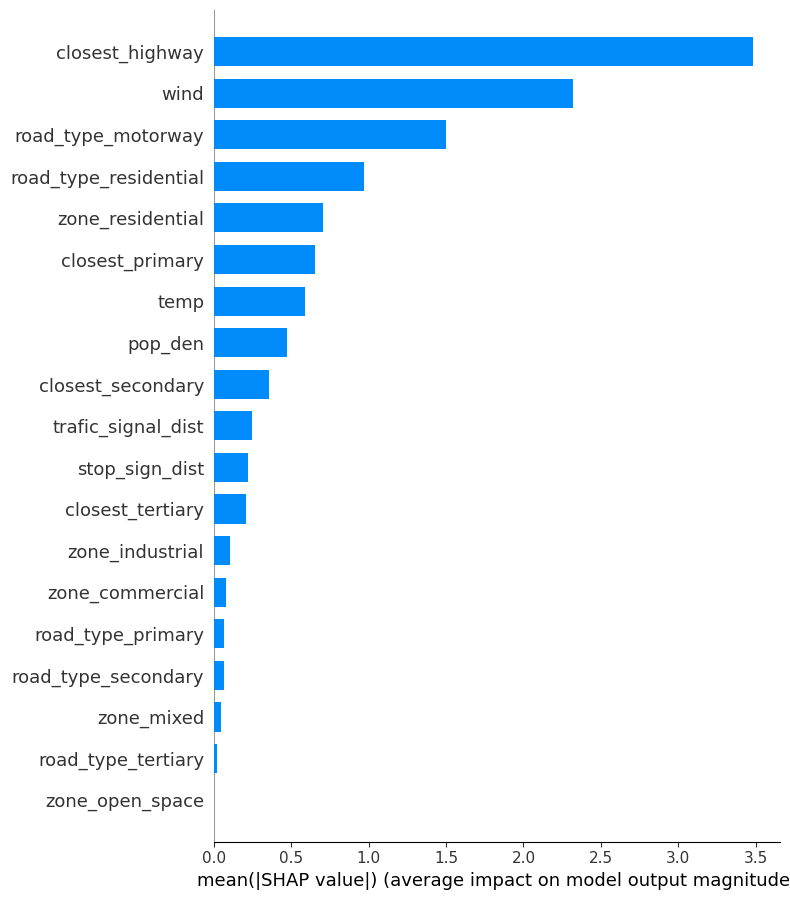

In [112]:
# Plot the SHAP summary plot to visualize feature importance (Global Distribution of Impact)
shap.summary_plot(shap_values, test_sample, plot_type="bar")

Findings:

1.   The plot ranks features by their mean absolute SHAP value, i.e., their average contribution (magnitude) to the model’s output across all observations. Higher SHAP values = greater influence on predicted NO₂ concentration.
2.   The distance to the nearest highway is the most influential factor. Locations closer to highways are likely exposed to higher vehicular emissions, leading to increased NO₂ concentrations.
3.   Wind speed has a strong impact. Higher wind speeds may disperse pollutants, reducing NO₂, while lower speeds can cause accumulation near emission sources.
4. The presence or proximity of motorways substantially affects NO₂, consistent with traffic-based emission patterns.
5. Residential road types show a moderate influence, possibly indicating lower NO₂ in residential areas compared to major traffic zones.
6. Areas zoned as residential tend to experience reduced NO₂ levels relative to industrial or commercial zones.
7. The distance to primary roads also affects NO₂, reflecting traffic volume and density around major streets.
8. Temperature influences photochemical reactions involving NO₂; warmer conditions may increase pollutant formation or dispersion.
9. Areas with higher population density may have more traffic or localized emissions, contributing to elevated NO₂.
10. Proximity to secondary roads affects NO₂, but less than highways and primary routes.
11. The density of intersections or stops slightly influences NO₂, as idling and acceleration near signals can increase emissions locally.






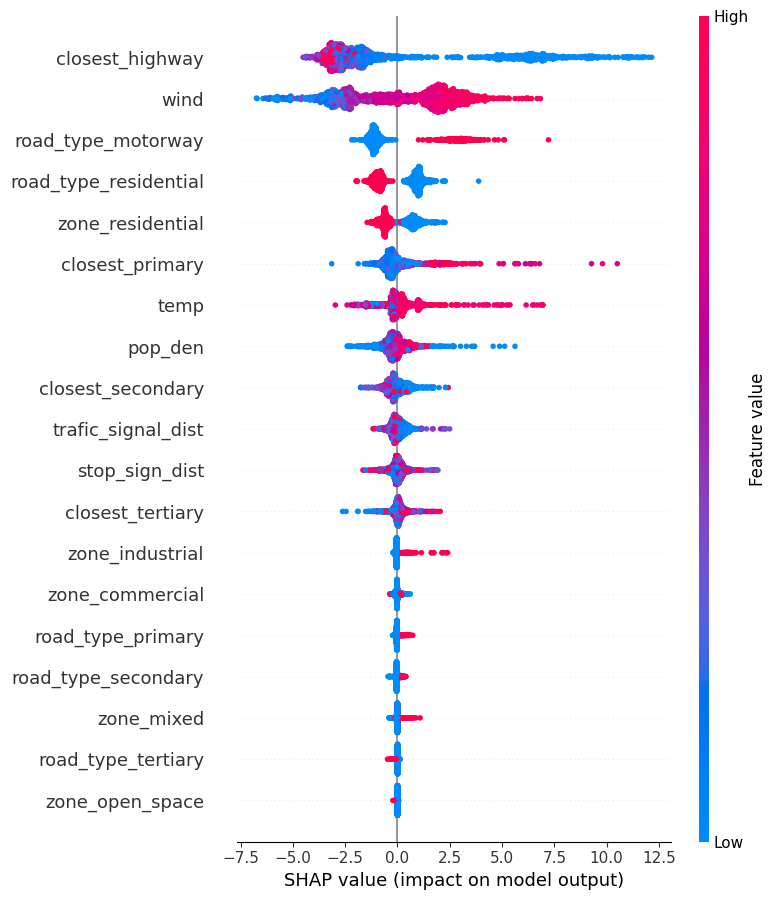

In [113]:
# Beeswarm Plot (Global Distribution of Impact)
shap.summary_plot(shap_values, test_sample)

Finding:
1.   Traffic proximity dominates NO₂ prediction.
     *   Being near highways, motorways, or primary/secondary roads substantially increases NO₂ levels.
2.   Wind speed strongly reduce NO₂.
     *   High winds disperse pollutants, while stagnant air raises local concentrations.
3.  Land use and zoning matter.
     *   Residential and open-space areas correspond to lower NO₂, while commercial and industrial zones contribute modestly to higher NO₂.
4. Meteorological and demographic factors amplify patterns.
     *   Higher temperatures and denser populations associate with elevated NO₂, consistent with urban heat and emission intensity.







In [114]:
# Compute mean absolute SHAP values for each feature
feature_importance = np.abs(shap_values).mean(axis=0)

# Create a DataFrame sorted by importance
importance_df = pd.DataFrame({
    'Feature': test_sample.columns,
    'Mean |SHAP value|': feature_importance
}).sort_values(by='Mean |SHAP value|', ascending=False)

print(importance_df)

                  Feature  Mean |SHAP value|
3         closest_highway           3.482600
1                    wind           2.317089
9      road_type_motorway           1.501730
11  road_type_residential           0.971127
18       zone_residential           0.703060
4         closest_primary           0.656462
2                    temp           0.589413
0                 pop_den           0.471680
5       closest_secondary           0.358038
7      trafic_signal_dist           0.248046
8          stop_sign_dist           0.219728
6        closest_tertiary           0.204605
15        zone_industrial           0.102645
14        zone_commercial           0.076608
10      road_type_primary           0.065941
12    road_type_secondary           0.063642
16             zone_mixed           0.046967
13     road_type_tertiary           0.021317
17        zone_open_space           0.001088


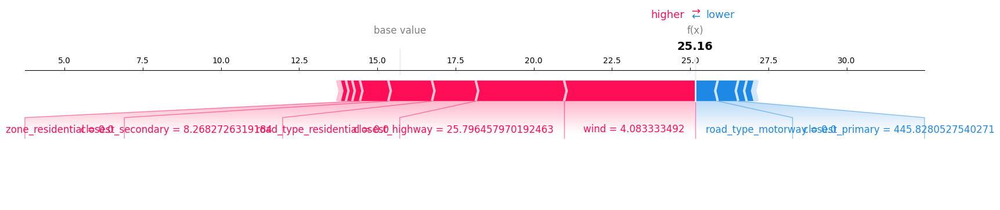

In [115]:
# --- Option 3: Individual Prediction (Local Explanation)
# Explain one sample (for example, the first test instance)
sample_index = 4
shap.force_plot(
    explainer.expected_value,
    shap_values[sample_index, :],
    test_sample.iloc[sample_index, :],
    matplotlib=True
)

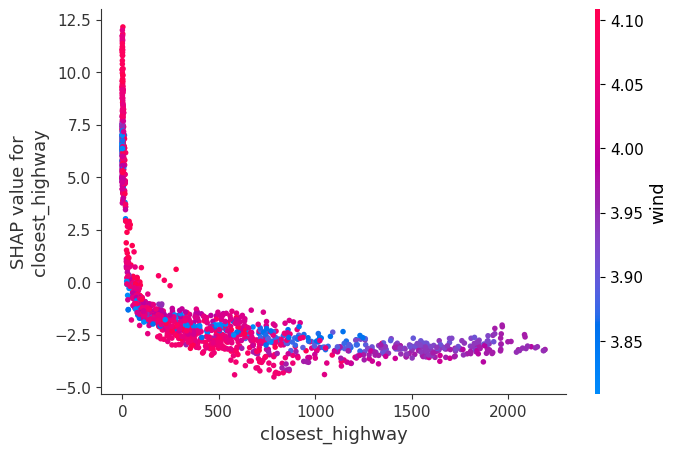

In [116]:
# --- Option 4: Dependence Plot (Feature Interaction)
# Shows how a single feature affects predictions
shap.dependence_plot("closest_highway", shap_values, test_sample)  # can replace with another feature name

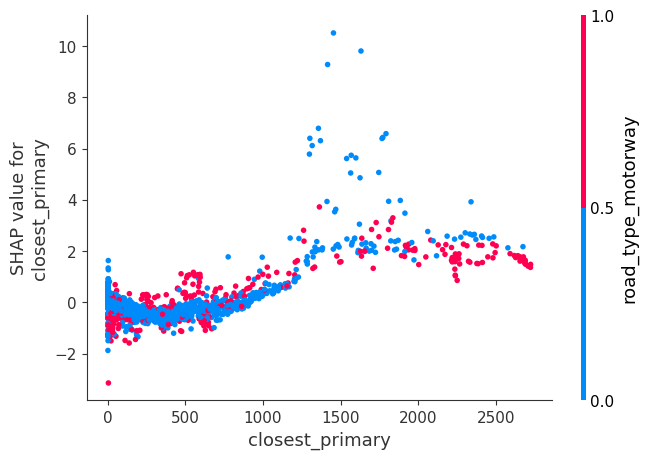

In [117]:
# --- Option 4: Dependence Plot (Feature Interaction)
# Shows how a single feature affects predictions
shap.dependence_plot("closest_primary", shap_values, test_sample)

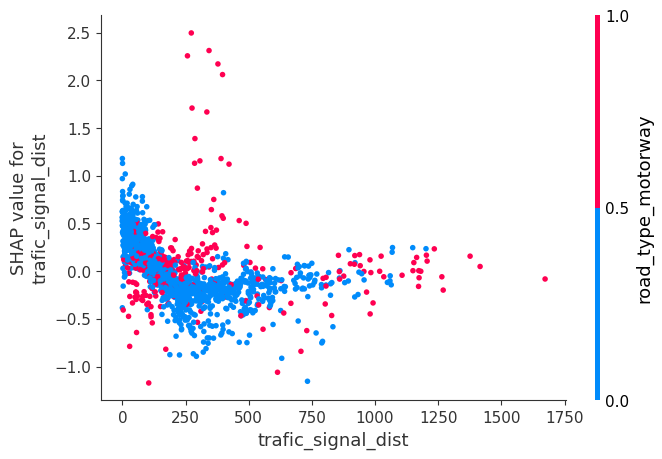

In [118]:
# --- Option 4: Dependence Plot (Feature Interaction)
# Shows how a single feature affects predictions
shap.dependence_plot("trafic_signal_dist", shap_values, test_sample)

### Use LIME to deeply explore feature importance direction

In [119]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=605bbd1cfaef8bf7c2bdf3b66d77819f753d248f8a770cc070dbeebf4c865caa
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [120]:
import lime
import lime.lime_tabular

In [121]:
# Using LIME for interpretability
# Initialize the LIME explainer
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(
    training_data=np.array(X_train_NO2),
    feature_names=X.columns,
    mode='regression'
)

# Select a single instance from the test set to explain
instance = X_test_NO2.iloc[4].values

# Explain the model's prediction for this instance
exp = explainer.explain_instance(
    data_row=instance.flatten(),
    predict_fn=RFores_GridSearch_no2.best_estimator_.predict # Use the best estimator from GridSearchCV
)

# Display the explanation
exp.show_in_notebook(show_table=False)
exp.as_list()  # List of feature contributions to the prediction

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


[('wind <= 3.94', -4.903692399164164),
 ('road_type_motorway <= 0.00', -4.9012108219843995),
 ('closest_highway > 800.14', -4.204293451443993),
 ('closest_primary > 687.42', 3.4809640399061634),
 ('road_type_residential <= 0.00', 1.3485586367978568),
 ('0.00 < zone_residential <= 1.00', -0.8071210189548479),
 ('pop_den > 5728.04', 0.5714867867335011),
 ('closest_secondary <= 42.24', 0.4286399045604948),
 ('zone_industrial <= 0.00', -0.4094350879421572),
 ('zone_mixed <= 0.00', -0.35638296962733784)]

## Summary:
1. Predictive Variable: NO2 concentration (nitrogen dioxide level)
2. LIME explains which local environmental and spatial factors increase or decrease this predicted NO₂ level.
3. Environmental Insight:
    *   **Traffic-related**: Distance from motorways and highways is the most influential factor lowering NO₂, confirming that vehicular emissions dominate NO₂ patterns. For example, being farther than ~800 m from a highway reduces NO₂ concentration, less exposure to vehicle exhaust. No nearby primary road also contributes to cleaner air.
    *   **Land use**: Residential zones are cleaner; non-residential or mixed-use zones raise NO₂, likely due to industrial or commercial sources
    *   **Meteorological**: Low temperature and weak wind slightly reduce predicted NO₂ in this instance, though the wind effect could vary regionally.
    *   **Model reliability**: The strongest LIME coefficients (around −4.5 to −5.0) belong to traffic proximity features, suggesting the regression model heavily relies on spatial road network variables to estimate NO₂.